In [ ]:
from google.colab import files
files.upload()

Saving models.py to models.py


{'models.py': b'from tensorflow.keras.layers import *\r\nfrom tensorflow.keras.models import Model\r\n\r\ndef Unet(dims):\r\n    inp = Input(dims)\r\n\r\n    conv_1 = Conv2D(filters = 64, kernel_size = 3, padding= \'same\', activation= \'relu\')(inp)\r\n    conv_1 = Conv2D(filters = 64, kernel_size = 3, padding= \'same\', activation= \'relu\')(conv_1)\r\n    max_pool1 = MaxPool2D(pool_size=(2,2))(conv_1)\r\n\r\n    conv_2 = Conv2D(filters = 128, kernel_size = 3, padding= \'same\', activation= \'relu\')(max_pool1)\r\n    conv_2 = Conv2D(filters = 128, kernel_size = 3, padding= \'same\', activation= \'relu\')(conv_2)\r\n    bn_2 = BatchNormalization(axis=3)(conv_2)\r\n    max_pool2 = MaxPool2D(pool_size=(2,2))(bn_2)\r\n\r\n    conv_3 = Conv2D(filters = 256, kernel_size = 3, padding= \'same\', activation= \'relu\')(max_pool2)\r\n    conv_3 = Conv2D(filters = 256, kernel_size = 3, padding= \'same\', activation= \'relu\')(conv_3)\r\n    max_pool3 = MaxPool2D(pool_size=(2,2))(conv_3)\r\n    

In [ ]:
# ! pip install -q kaggle
import numpy as np
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from keras.layers import *
from keras.models import *
import random
from models import Unet, ResUNet
import keras.backend as K
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

In [ ]:
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [ ]:
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation
!unzip lgg-mri-segmentation.zip

In [ ]:
path = "lgg-mri-segmentation/kaggle_3m/"
df = pd.read_csv(path+'data.csv')
df.head(3)

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0


In [ ]:
#Source - https://www.kaggle.com/monkira/brain-mri-segmentation-using-unet-keras/notebook
train_images = []
mask_images_all = []
mask_images = []
non_tumor_mask = []
non_tumor_train = []

mask_images_all = glob(path+'*/*_mask*')#get all files that have mask at end in each subfolder
for i in mask_images_all:
  if np.all(cv2.imread(i) == 0):
    non_tumor_mask.append(i)
    non_tumor_train.append(i.replace("_mask",''))
  else:  
    mask_images.append(i)
    train_images.append(i.replace("_mask",''))
print("Tumor Train Images : {0}\nTumor Mask Images : {1}\nNon Tumor Train Images : {2}\nNon Tumor Mask Images : {3}".format(len(train_images),len(mask_images),len(non_tumor_train),len(non_tumor_mask)))    

pairs = list(zip(non_tumor_train,non_tumor_mask))
random.seed(1)
pairs = random.sample(pairs, 700)  # pick 700 random pairs
non_tumor_train1, non_tumor_mask1 = zip(*pairs)

df = pd.DataFrame({'Images':train_images + list(non_tumor_train1),'Masks':mask_images + list(non_tumor_mask1)})
df.head()

Tumor Train Images : 1373
Tumor Mask Images : 1373
Non Tumor Train Images : 2556
Non Tumor Mask Images : 2556


,Images,Masks
0,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...
1,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...
2,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...
3,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...
4,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...,lgg-mri-segmentation/kaggle_3m/TCGA_DU_7008_19...


In [ ]:
df_train, df_test = train_test_split(df,test_size = 0.2, random_state = 42)
print("Train Set : {0}\nTest Set : {1}".format(df_train.values.shape[0],df_test.values.shape[0])) 

Train Set : 1658
Test Set : 415


In [ ]:
def data_generator(df,augmentation):
  image_generator = augmentation.flow_from_dataframe(
      df,
      x_col = "Images",
      target_size=(256, 256),
      color_mode="rgb",
      batch_size=32,
      seed=1,
      class_mode= None
  )

  mask_generator = augmentation.flow_from_dataframe(
      df,
      x_col = "Masks",
      target_size=(256, 256),
      color_mode="grayscale",
      batch_size=32,
      seed=1,
      class_mode= None
  )
  
  gen = zip(image_generator, mask_generator)

  for image, mask in gen:
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    yield image,mask
  
train_aug = ImageDataGenerator(
    horizontal_flip = True,
    rescale = 1./255,
    rotation_range=0.2,
    width_shift_range=0.05,
    height_shift_range=0.05,
    shear_range=0.05,
    zoom_range=0.05)

test_aug = ImageDataGenerator(
    horizontal_flip = True,
    rescale = 1./255)

train_gen = data_generator(df_train,train_aug)
test_gen = data_generator(df_test,test_aug)    

In [ ]:
def plot(train,test,title, metric):
  plt.plot(train)
  plt.plot(test)
  plt.title(title)
  plt.ylabel(metric)
  plt.xlabel('Epochs')
  plt.legend(['train', 'test'])
  plt.show()

In [ ]:
def show(model):
  for i in range(30):
    index=np.random.randint(1,len(df_test.index))
    img = cv2.imread(df_test['Images'].iloc[index])
    img = cv2.resize(img ,(256, 256))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred= model.predict(img)

    plt.figure(figsize=(12,12))
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')
    plt.subplot(1,3,2)
    plt.imshow(np.squeeze(cv2.imread(df_test['Masks'].iloc[index])))
    plt.title('Original Mask')
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(pred) > .5)
    plt.title('Prediction')
    plt.show()

# Loss and Callbacks

## Dice Loss

In [ ]:
# Source - https://github.com/nabsabraham/focal-tversky-unet/blob/master/losses.py

def dsc(y_true, y_pred):
  smooth = 1.
  y_true_f = K.flatten(y_true)
  y_pred_f = K.flatten(y_pred)
  intersection = K.sum(y_true_f * y_pred_f)
  score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
  return score

def dice_loss(y_true, y_pred):
  loss = 1 - dsc(y_true, y_pred)
  return loss

## Focal Tversky Loss

In [ ]:
# Source - https://github.com/nabsabraham/focal-tversky-unet/blob/master/losses.py

def tversky(y_true, y_pred):
  smooth = 1.
  y_true_pos = K.flatten(y_true)
  y_pred_pos = K.flatten(y_pred)
  true_pos = K.sum(y_true_pos * y_pred_pos)
  false_neg = K.sum(y_true_pos * (1-y_pred_pos))
  false_pos = K.sum((1-y_true_pos)*y_pred_pos)
  alpha = 0.7
  return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def focal_tversky(y_true,y_pred):
  y_true = tf.cast(y_true, tf.float32)
  y_pred = tf.cast(y_pred, tf.float32)
  
  pt_1 = tversky(y_true, y_pred)
  gamma = 0.75
  return K.pow((1-pt_1), gamma)

def tversky_loss(y_true, y_pred):
  return 1 - tversky(y_true,y_pred)

## IOU

In [ ]:
def iou(y_true, y_pred):
  smooth = 1.
  intersection = K.sum(y_true * y_pred)
  sum = K.sum(y_true + y_pred)
  iou = (intersection + smooth) / (sum - intersection + smooth)
  return iou

## Callbacks

In [ ]:
checkpointer = ModelCheckpoint(filepath="ResUNet-tversky_loss.hdf5", 
                               verbose=1, 
                               save_best_only=True
                              )
earlystopping = EarlyStopping(monitor='val_loss',
                              mode='auto', 
                              verbose=1, 
                              patience=15
                             )
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='auto',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )

#Training

## Unet-dice_loss

In [ ]:
unet = Unet((256,256,3))
unet.compile(optimizer = 'adam', loss = dice_loss, metrics = [dsc, iou,'acc'])

In [ ]:
history = unet.fit(train_gen,epochs = 100, steps_per_epoch=len(df_train)/32, validation_data = test_gen, validation_steps= len(df_test)/32, callbacks = [checkpointer, earlystopping, reduce_lr])

Found 1658 validated image filenames.
Found 1658 validated image filenames.
Epoch 1/100
52/51 [==============================] - ETA: 0s - loss: 0.6200 - dsc: 0.3800 - iou: 0.2614 - acc: 0.9119Found 415 validated image filenames.
Found 415 validated image filenames.
51/51 [==============================] - 112s 2s/step - loss: 0.6179 - dsc: 0.3821 - iou: 0.2628 - acc: 0.9128 - val_loss: 1.0000 - val_dsc: 2.8237e-05 - val_iou: 2.8237e-05 - val_acc: 0.9820

Epoch 00001: val_loss improved from inf to 0.99997, saving model to Unet-dice_loss.hdf5
Epoch 2/100
51/51 [==============================] - 88s 2s/step - loss: 0.4521 - dsc: 0.5479 - iou: 0.3821 - acc: 0.9825 - val_loss: 0.5420 - val_dsc: 0.4576 - val_iou: 0.3012 - val_acc: 0.9863

Epoch 00002: val_loss improved from 0.99997 to 0.54197, saving model to Unet-dice_loss.hdf5
Epoch 3/100
51/51 [==============================] - 88s 2s/step - loss: 0.4410 - dsc: 0.5590 - iou: 0.3942 - acc: 0.9825 - val_loss: 0.3787 - val_dsc: 0.6214 - val

In [ ]:
a = history.history

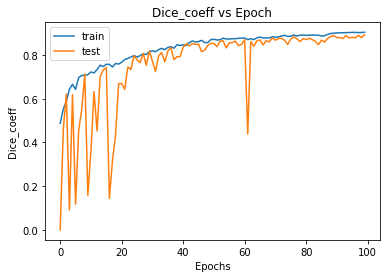

In [ ]:
plot(a['dsc'],a['val_dsc'],"Dice_coeff vs Epoch", "Dice_coeff")

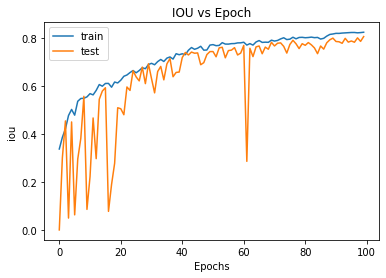

In [ ]:
plot(a['iou'],a['val_iou'],"IOU vs Epoch", "iou")

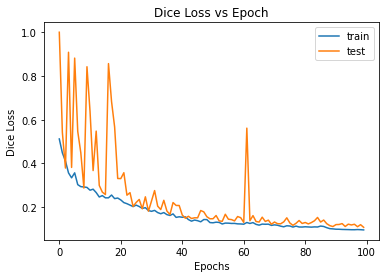

In [ ]:
plot(a['loss'],a['val_loss'],"Dice Loss vs Epoch", "Dice Loss")

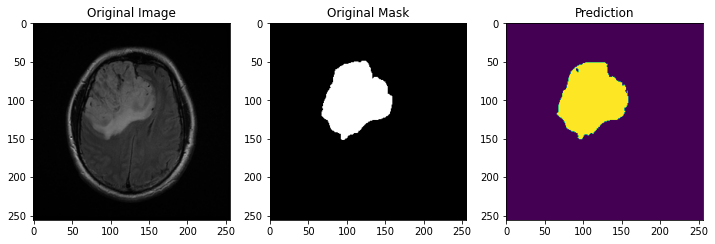

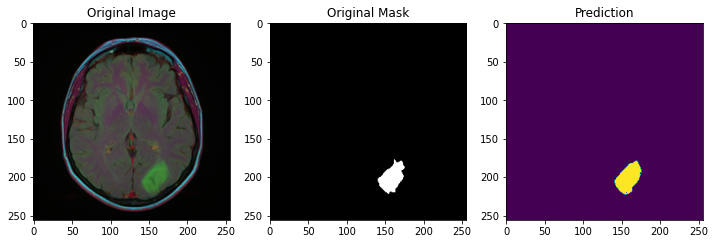

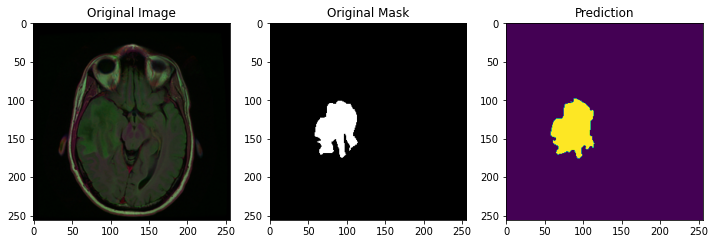

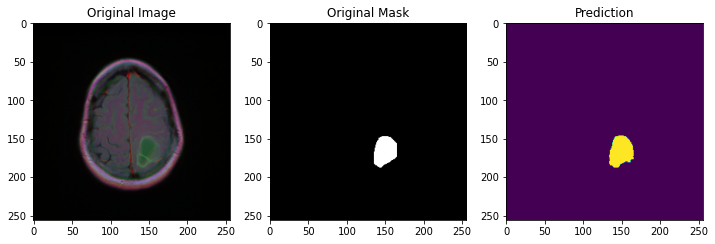

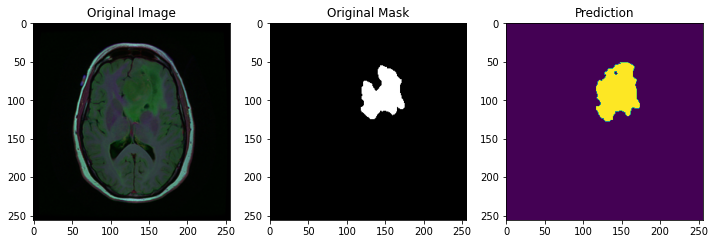

...

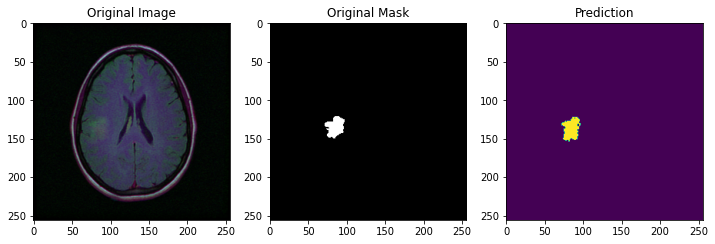

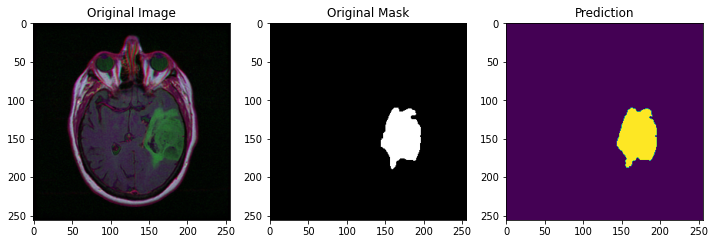

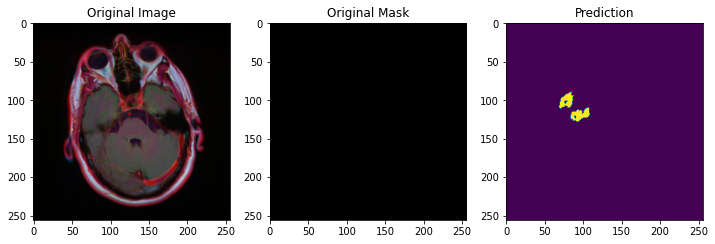

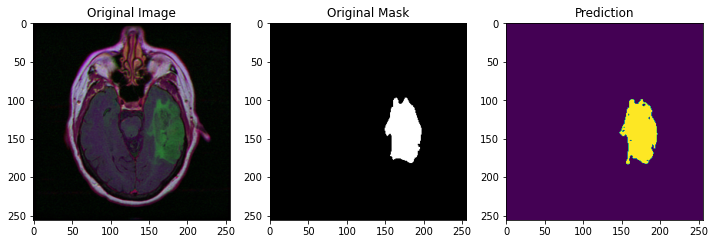

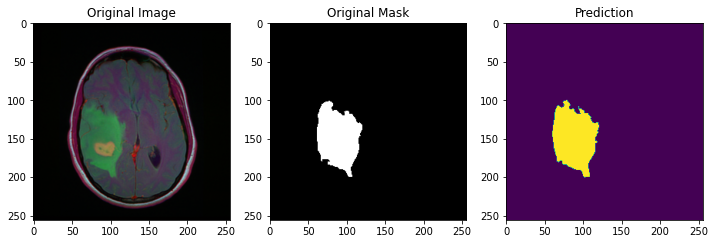

In [ ]:
show(unet)

## ResUNet-dice_loss

In [ ]:
resunet = ResUNet()
resunet.compile(optimizer = 'adam', loss = dice_loss, metrics = [dsc, iou,'acc'])

In [ ]:
history = resunet.fit(train_gen,epochs = 100, steps_per_epoch=len(df_train)/32, validation_data = test_gen, validation_steps= len(df_test)/32, callbacks = [checkpointer, earlystopping, reduce_lr])

Found 1658 validated image filenames.
Found 1658 validated image filenames.
Epoch 1/100
52/51 [==============================] - ETA: 0s - loss: 0.5680 - dsc: 0.4320 - iou: 0.3042 - acc: 0.9190Found 415 validated image filenames.
Found 415 validated image filenames.
51/51 [==============================] - 52s 798ms/step - loss: 0.5654 - dsc: 0.4346 - iou: 0.3063 - acc: 0.9199 - val_loss: 0.9625 - val_dsc: 0.0375 - val_iou: 0.0191 - val_acc: 0.0745

Epoch 00001: val_loss improved from inf to 0.96253, saving model to ResUNet-dice_loss.hdf5
Epoch 2/100
51/51 [==============================] - 38s 738ms/step - loss: 0.3341 - dsc: 0.6659 - iou: 0.5037 - acc: 0.9876 - val_loss: 1.0000 - val_dsc: 2.7362e-05 - val_iou: 2.7362e-05 - val_acc: 0.9815

Epoch 00002: val_loss did not improve from 0.96253
Epoch 3/100
51/51 [==============================] - 37s 729ms/step - loss: 0.3061 - dsc: 0.6939 - iou: 0.5385 - acc: 0.9890 - val_loss: 0.7303 - val_dsc: 0.2698 - val_iou: 0.1573 - val_acc: 0.9350

In [ ]:
a = history.history

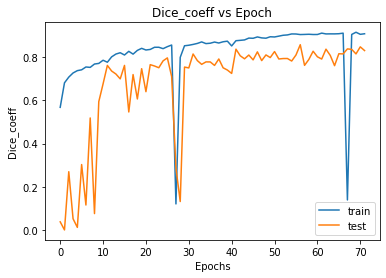

In [ ]:
plot(a['dsc'],a['val_dsc'],"Dice_coeff vs Epoch", "Dice_coeff")

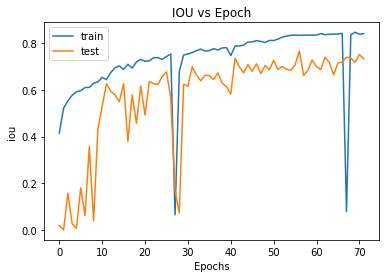

In [ ]:
plot(a['iou'],a['val_iou'],"IOU vs Epoch", "iou")

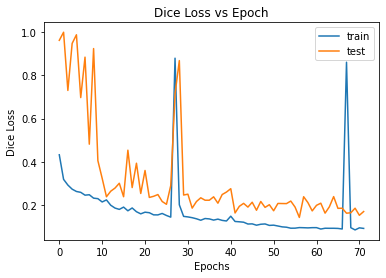

In [ ]:
plot(a['loss'],a['val_loss'],"Dice Loss vs Epoch", "Dice Loss")

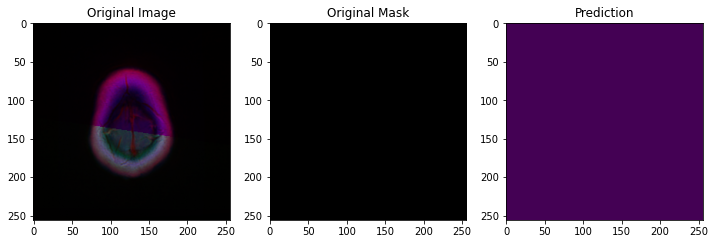

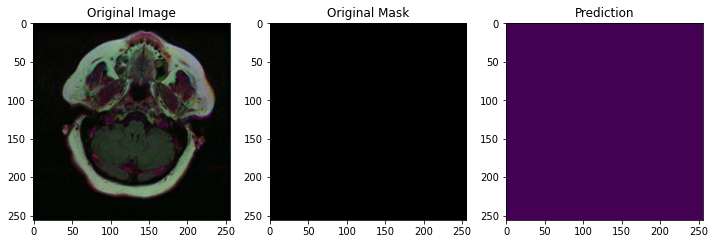

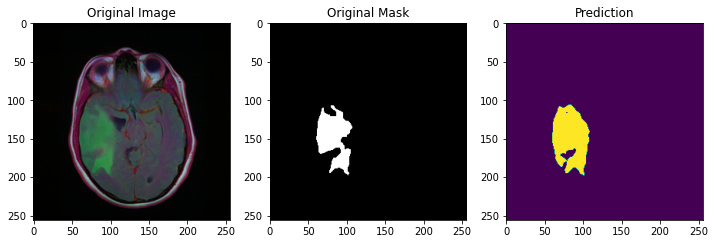

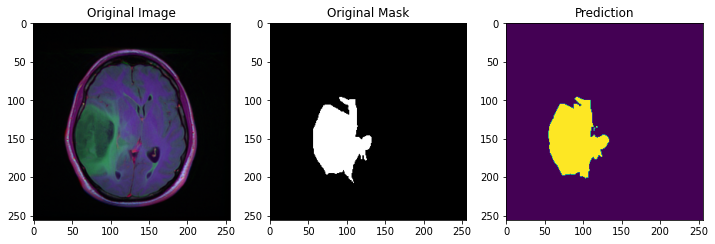

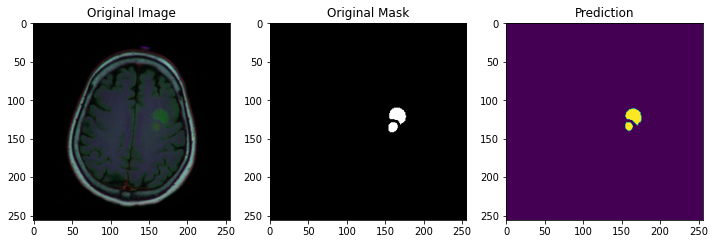

...

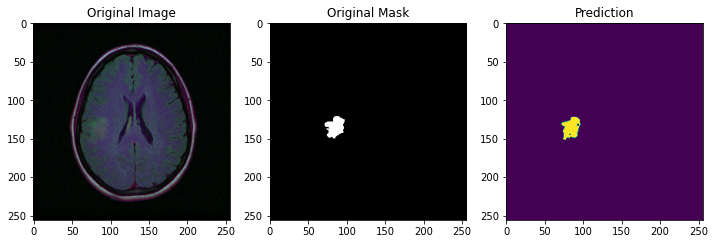

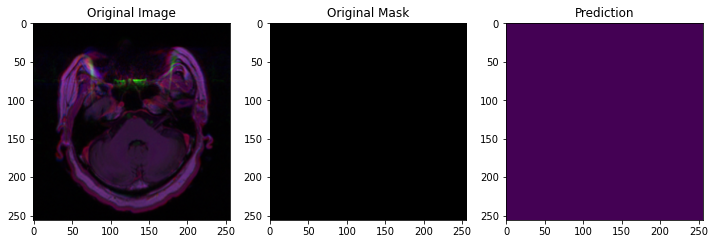

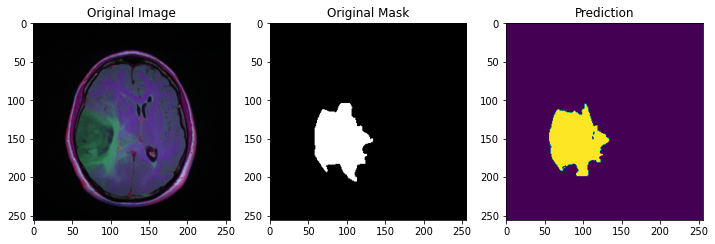

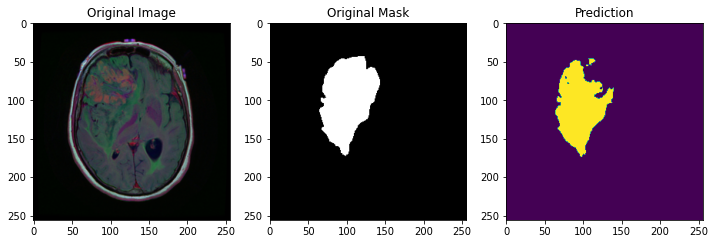

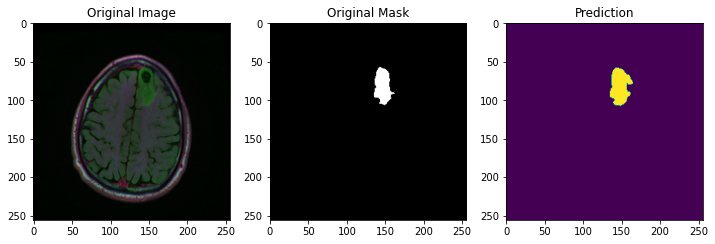

In [ ]:
show(resunet)

##Unet-Focal_Tversky_Loss

In [ ]:
unet = Unet((256,256,3))
unet.compile(optimizer = 'adam', loss = focal_tversky, metrics = [tversky, dsc, iou,'acc'])

In [ ]:
history = unet.fit(train_gen,epochs = 100, steps_per_epoch=len(df_train)/32, validation_data = test_gen, validation_steps= len(df_test)/32, callbacks = [checkpointer, earlystopping, reduce_lr])

Found 1658 validated image filenames.
Found 1658 validated image filenames.
Epoch 1/100
52/51 [==============================] - ETA: 0s - loss: 0.7760 - tversky: 0.2785 - dsc: 0.2392 - iou: 0.1533 - acc: 0.7813Found 415 validated image filenames.
Found 415 validated image filenames.
51/51 [==============================] - 114s 2s/step - loss: 0.7739 - tversky: 0.2810 - dsc: 0.2418 - iou: 0.1552 - acc: 0.7835 - val_loss: 1.0000 - val_tversky: 4.0455e-05 - val_dsc: 2.8400e-05 - val_iou: 2.8318e-05 - val_acc: 0.9820

Epoch 00001: val_loss improved from inf to 0.99997, saving model to Unet-tversky_loss.hdf5
Epoch 2/100
51/51 [==============================] - 87s 2s/step - loss: 0.5328 - tversky: 0.5661 - dsc: 0.5243 - iou: 0.3600 - acc: 0.9776 - val_loss: 0.5484 - val_tversky: 0.5489 - val_dsc: 0.4975 - val_iou: 0.3358 - val_acc: 0.9750

Epoch 00002: val_loss improved from 0.99997 to 0.54838, saving model to Unet-tversky_loss.hdf5
Epoch 3/100
51/51 [==============================] - 87s

In [ ]:
a = history.history

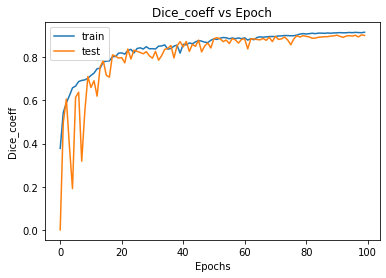

In [ ]:
plot(a['dsc'],a['val_dsc'],"Dice_coeff vs Epoch", "Dice_coeff")

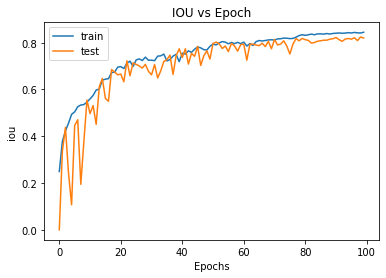

In [ ]:
plot(a['iou'],a['val_iou'],"IOU vs Epoch", "iou")

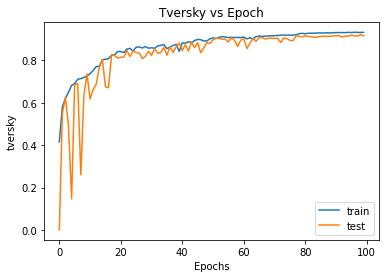

In [ ]:
plot(a['tversky'],a['val_tversky'],"Tversky vs Epoch", "tversky")

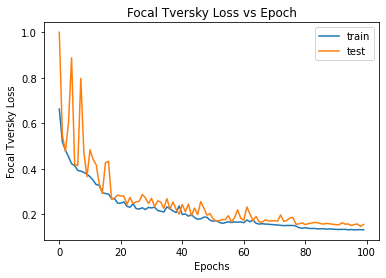

In [ ]:
plot(a['loss'],a['val_loss'],"Focal Tversky Loss vs Epoch", "Focal Tversky Loss")

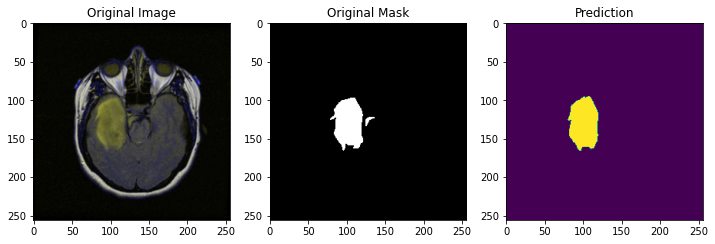

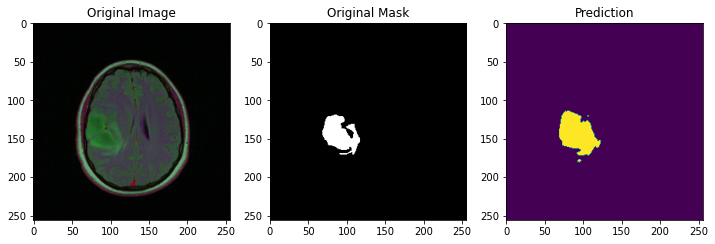

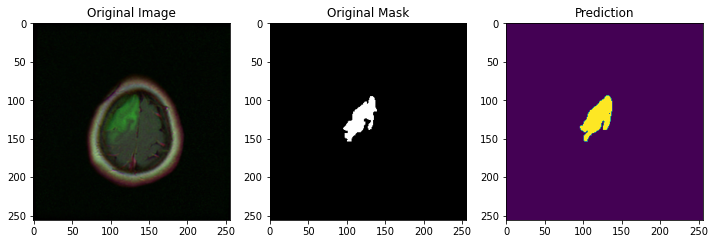

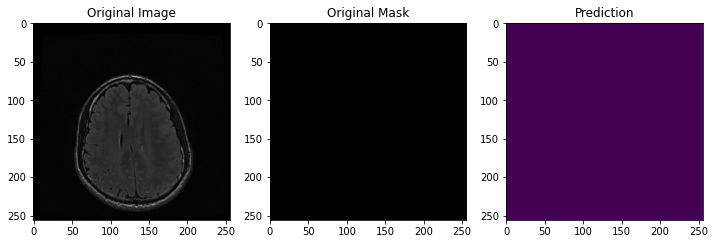

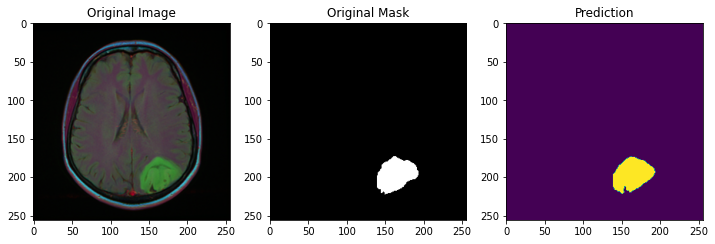

...

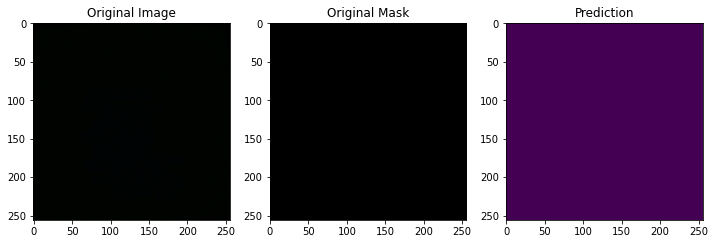

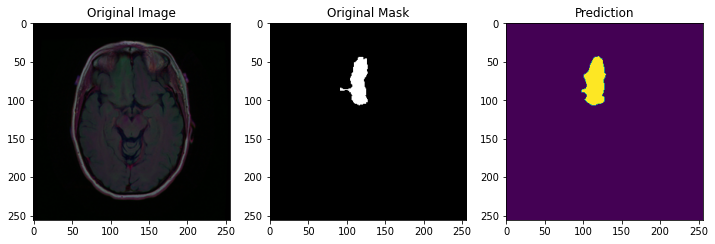

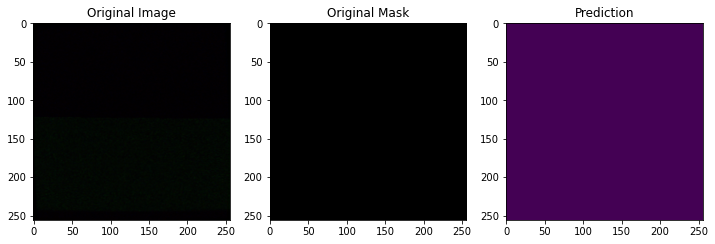

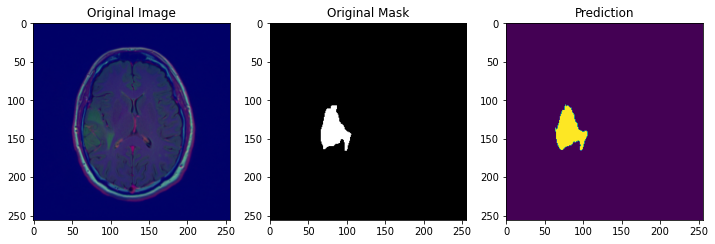

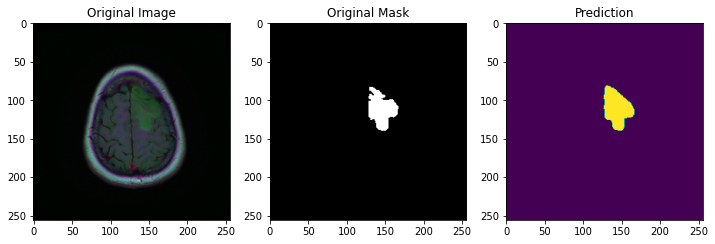

In [ ]:
show(unet)

##ResUNet-Focal_Tversky_Loss

In [ ]:
resunet = ResUNet()
resunet.compile(optimizer = 'adam', loss = focal_tversky, metrics = [tversky, dsc, iou,'acc'])

In [ ]:
history = resunet.fit(train_gen,epochs = 100, steps_per_epoch=len(df_train)/32, validation_data = test_gen, validation_steps= len(df_test)/32, callbacks = [checkpointer, earlystopping, reduce_lr])

Epoch 1/100
51/51 [==============================] - 61s 1s/step - loss: 0.6419 - tversky: 0.4373 - dsc: 0.3903 - iou: 0.2644 - acc: 0.9055 - val_loss: 0.9530 - val_tversky: 0.0621 - val_dsc: 0.0383 - val_iou: 0.0195 - val_acc: 0.1601

Epoch 00001: val_loss improved from inf to 0.95300, saving model to ResUNet-tversky_loss.hdf5
Epoch 2/100
51/51 [==============================] - 47s 909ms/step - loss: 0.4127 - tversky: 0.6910 - dsc: 0.6702 - iou: 0.5087 - acc: 0.9859 - val_loss: 0.9406 - val_tversky: 0.0784 - val_dsc: 0.0486 - val_iou: 0.0249 - val_acc: 0.2817

Epoch 00002: val_loss improved from 0.95300 to 0.94057, saving model to ResUNet-tversky_loss.hdf5
Epoch 3/100
51/51 [==============================] - 47s 907ms/step - loss: 0.3884 - tversky: 0.7139 - dsc: 0.6930 - iou: 0.5401 - acc: 0.9870 - val_loss: 0.9448 - val_tversky: 0.0729 - val_dsc: 0.0451 - val_iou: 0.0231 - val_acc: 0.2315

Epoch 00003: val_loss did not improve from 0.94057
Epoch 4/100
51/51 [========================

In [ ]:
a = history.history

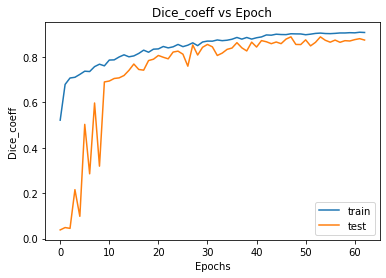

In [ ]:
plot(a['dsc'],a['val_dsc'],"Dice_coeff vs Epoch", "Dice_coeff")

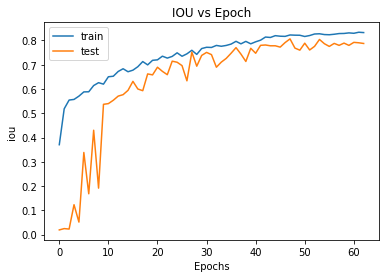

In [ ]:
plot(a['iou'],a['val_iou'],"IOU vs Epoch", "iou")

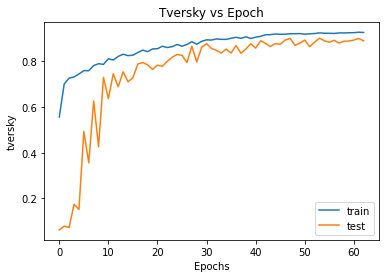

In [ ]:
plot(a['tversky'],a['val_tversky'],"Tversky vs Epoch", "tversky")

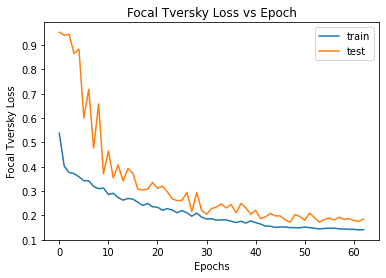

In [ ]:
plot(a['loss'],a['val_loss'],"Focal Tversky Loss vs Epoch", "Focal Tversky Loss")

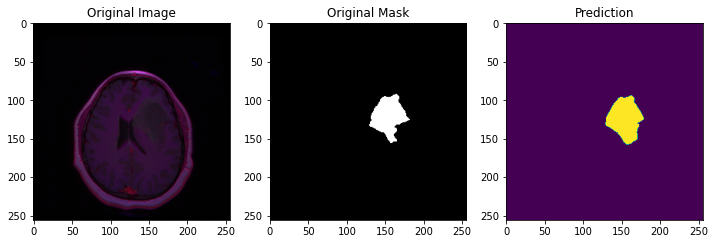

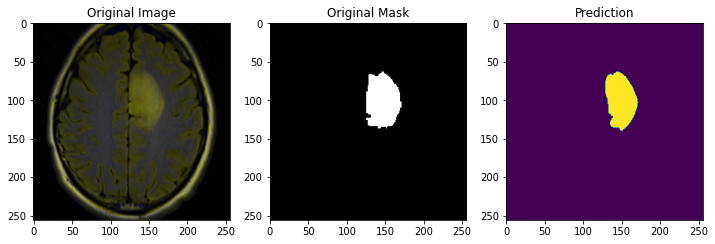

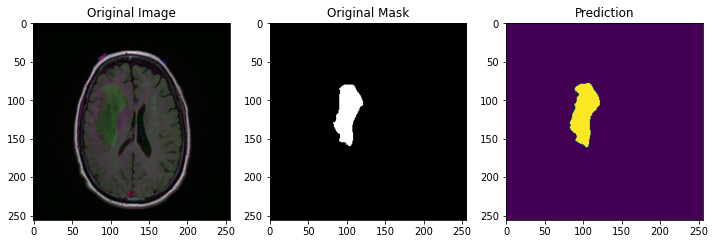

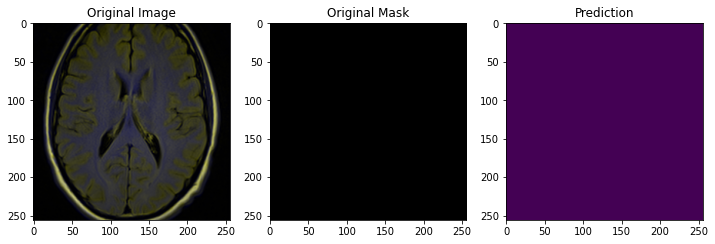

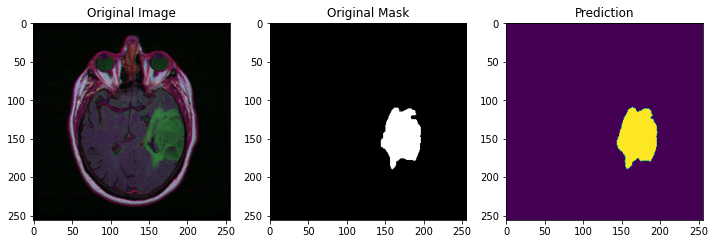

...

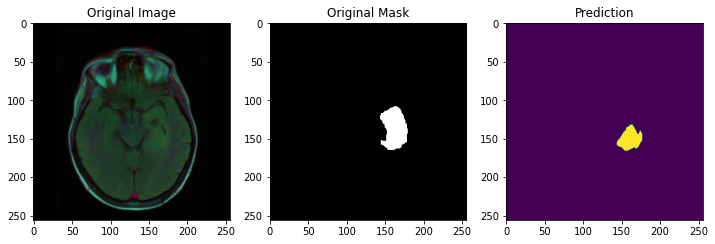

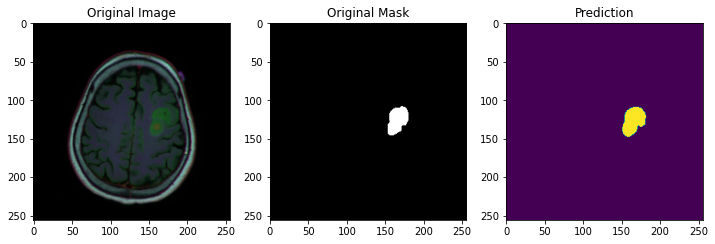

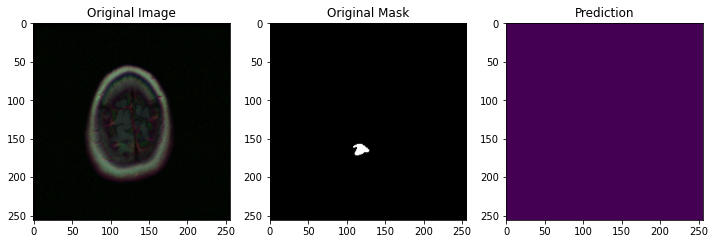

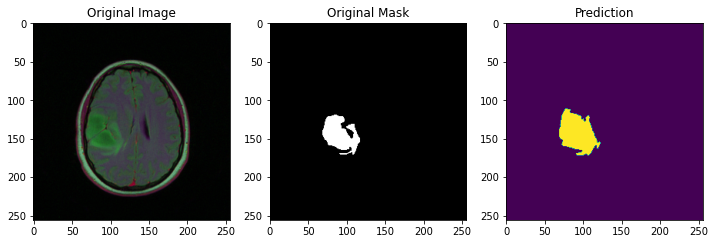

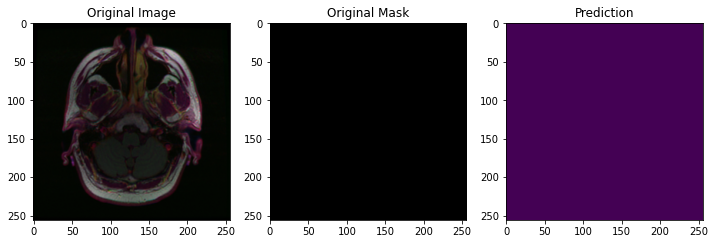

In [ ]:
show(resunet)